# Генератор синтетических изображений с номерными знаками Ru

Генератор берет случайное изображение из заданного каталога, генерирует изображения номерного знака, используя изображения символов на номерных знаках (все символы при генерации выбираются случайным образом). После этого изображение номерного знака искажается (шумом, блюром, ресайзом и поворотом вокруг центра) и помещается на исходное изображение в случайное место. 
Номерных знаков на изображении может быть от 1 до 4х.

In [10]:
import cv2
import os 
import random
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import albumentations as A

from tqdm.notebook import trange, tqdm

Определяем директорию с базовыми картинками и подготавливаем список фотографий для генератора

In [11]:
directory = 'data\general_photo' 

In [12]:
files = [os.path.join(directory, i) for i in os.listdir(directory)] 

Определяем вспомогательные функции

In [94]:
def visualize(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(image)
    
transform_picture = A.Compose([
                                A.RandomRotate90(),
                                A.Flip(),
                                A.Transpose(),
                                A.OneOf([
                                    A.IAAAdditiveGaussianNoise(),
                                    A.GaussNoise(),
                                ], p=0.2),
                                A.OneOf([
                                    A.MotionBlur(p=.2),
                                    A.MedianBlur(blur_limit=3, p=0.1),
                                    A.Blur(blur_limit=3, p=0.1),
                                ], p=0.2),
                                A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=45, p=0.2),
                                A.OneOf([
                                    A.OpticalDistortion(p=0.3),
                                    A.GridDistortion(p=.1),
                                    A.IAAPiecewiseAffine(p=0.3),
                                ], p=0.2),
                                A.OneOf([
                                    A.CLAHE(clip_limit=2),
                                    A.IAASharpen(),
                                    A.IAAEmboss(),
                                    A.RandomBrightnessContrast(),            
                                ], p=0.3),
                                A.HueSaturationValue(p=0.3),
                            ])
transform_number = A.Compose([
                                A.OneOf([
                                    A.IAAAdditiveGaussianNoise(),
                                    A.GaussNoise(),
                                ], p=0.7),
                                A.OneOf([
                                    A.MotionBlur(p=.3),
                                    A.MedianBlur(blur_limit=3, p=0.3),
                                    A.Blur(blur_limit=3, p=0.3),
                                ], p=0.5),
                                A.OneOf([
                                    A.IAASharpen(),
                                    A.IAAEmboss(),
                                    A.RandomBrightnessContrast(brightness_limit=0.5, contrast_limit=0.5),            
                                ], p=0.8),
                                A.HueSaturationValue(p=0.9),
                            ])

Функция добавления шума на изображение:

In [95]:
def make_noisy(image, var):
    row,col,ch= image.shape
    mean = 0
    sigma = var**0.5
    gauss = np.random.normal(mean,sigma,(row,col,ch))
    gauss = gauss.reshape(row,col,ch)
    noisy = image + gauss

    return noisy

Класс генерируемого изображения:

In [96]:
class pic(object):
    def __init__(self, files):
        self.image_path = self.take_random_pic(files)
#         print(self.image_path)
        self.image = cv2.imread(self.image_path, cv2.IMREAD_UNCHANGED)
        self.image = transform_picture(image=self.image)['image']
        self.image = self.resize(size=(1200, 750))
        self.rectangles = []
        self.numbers = []
        self.numbers_str = []      
    def take_random_pic(self, files):
        random.shuffle(files)
        return files[0]

    def viewImage(self):
        fig, ax = plt.subplots(figsize=(20, 40))
        ax.imshow(cv2.cvtColor(self.image.astype('uint8'), cv2.COLOR_BGR2RGB))

    def resize(self, size=(1200, 750)):
        return cv2.resize(self.image, size)
    
    def add_rectangle(self, rect, x, y):

        b = np.copy(self.image)
        b[y: y + rect.shape[0], x: x + rect.shape[1], :] = rect
        self.image = b
        
    def add_rotated_plate(self, plate):
        
        pl = plate.image
#         print(pl.shape)
        x = random.randint(0,550)
        y = random.randint(0,800)
#         print('x,y', x,y)
#         print('plshpe', pl.shape[0], pl.shape[1])
        image = self.image[x:x+pl.shape[0], y:y+pl.shape[1], :]
        step = 1
#         print('image', image.shape)
        result = image.copy()
        h_ = []
        w_ = []
        for h in range(step, pl.shape[0]):
            for w in range(step, pl.shape[1]):
                s = pl[h-step:h+step+1, w-step:w+step+1, :].sum()
                if s!=0:
                    result[h,w,:] = pl[h,w,:]
                    h_.append(h)
                    w_.append(w)
        self.image[x:x+pl.shape[0], y:y+pl.shape[1], :] = result
        h_min = min(h_) + x
        h_max = max(h_) + x
        w_min = min(w_) + y
        w_max = max(w_) + y
        self.rectangles.append(((w_min, h_min), (w_max, h_max)))
        self.numbers.append(plate.number)
        self.numbers_str.append(plate.number_str)
        
    def add_rectangles(self):
        result = self.image.copy()
        for r in self.rectangles:
            result = cv2.rectangle(result, r[0], r[1], (255, 0, 0), 2) 
        return result


Класс номерного знака для генератора:

In [97]:
class plate(object):
    def __init__(self):
        self.height = random.randint(40, 100)
        self.width = random.randint(100, 200)
        self.image = cv2.imread(os.path.join('data', 'nomer-rus.jpg'), cv2.IMREAD_UNCHANGED)
        self.number, self.number_str = self.generate_number()
        self.place_number(self.number)
        self.image = transform_number(image=self.image)['image']
        self.image = self.resize(size=(self.width, self.height))
        self.image = self.rotate_plate(self.image, random.randint(-30,30))
        
        

    def generate_number(self):
        digits = list(range(0,10,1))
        letters = list(range(10,22,1))
        region_arr = [45, 12, 123, 76, 163, 116, 31, 66, 164, 89, 
                      159, 85, 36, 11, 64, 74, 190, 23, 43, 71, 17, 32, 
                      154, 127, 142, 8, 77, 33, 88, 29, 5, 16, 22, 14, 125, 
                      41, 55, 54, 102, 173, 138, 46, 91, 18, 82, 75, 96, 94, 
                      13, 81, 62, 80, 67, 51, 56, 40, 79, 38, 44, 1, 134, 39, 28, 
                      113, 95, 178, 97, 27, 10, 73, 58, 6, 136, 57, 72, 35, 174, 9, 
                      70, 34, 86, 26, 7, 24, 750, 121, 68, 197, 53, 196, 177, 52, 61, 
                      19, 186, 2, 4, 93, 199, 25, 37, 87, 152, 30, 47, 84, 48, 126, 65, 
                      83, 60, 21, 124, 99, 92, 98, 63, 49, 15, 161, 150, 69, 90, 42, 777, 
                      3, 59, 50, 169, 78]
        dict_ = {'0':'0', '1':'1', '2':'2', '3':'3', '4':'4', '5':'5', '6':'6', '7':'7', '8':'8', '9':'9', 
                '10':'A', '11':'B', '12':'C', '13':'E', '14':'H', '15':'K', '16':'M', '17':'O',
                '18':'P', '19':'T', '20':'X', '21':'Y'}
        number = []
        number.append(str(random.choice(letters)))
        number.append(str(random.choice(digits)))
        number.append(str(random.choice(digits)))
        number.append(str(random.choice(digits)))
        number.append(str(random.choice(letters)))
        number.append(str(random.choice(letters)))
        number.append(str(random.choice(region_arr)))
        number_str = ''
        for n in number[:-1]:
            number_str += dict_[n]
        number_str += number[-1]

        return number, number_str 
        
    def add_symbol(self, symbol, x, y, size):
#         print('Adding symbol {}'.format(symbol))
        sample = [os.path.join(os.path.join('data', 'symbols', str(symbol)), i) 
                  for i in os.listdir(os.path.join('data', 'symbols', str(symbol)))]
        rect = cv2.imread(random.choice(sample), cv2.IMREAD_UNCHANGED)
        rect = cv2.resize(rect, size)
        b = np.copy(self.image)
        b[y: y + rect.shape[0], x: x + rect.shape[1], :] = rect
        self.image = b
    
    def place_number(self, number):
        self.add_symbol(number[0], 180, 120, size=(180, 240))
        self.add_symbol(number[1], 400, 30, size=(180, 340))
        self.add_symbol(number[2], 590, 30, size=(180, 340))
        self.add_symbol(number[3], 780, 30, size=(180, 340))
        self.add_symbol(number[4], 1010, 120, size=(180, 240))
        self.add_symbol(number[5], 1200, 120, size=(180, 240))
        # region
        ln = len(str(number[-1]))
        if ln == 1:
            number[-1] = '0'+str(number[-1])
            ln = 2
        for i in range(ln):
            w = (300- (ln-1)*10)//ln 
            h = 210
            self.add_symbol(str(number[-1])[i], 1530+i*(w+10), 60, size=(w, h))
    
    def resize(self, size):
        return cv2.resize(self.image, size)
    
    def rotate_plate(self, plate, angle):
        (h, w, d) = plate.shape
        buffer = np.zeros(shape=(2*h,2*w,d)).astype('uint8')
        buffer[h//2:h//2+h, w//2:w//2+w,:] = plate
        center = (w, h)
        M = cv2.getRotationMatrix2D(center, angle, 0.5)
        rotated = cv2.warpAffine(buffer, M, (2*w, 2*h))
        return rotated
    
    def viewImage(self):
        fig, ax = plt.subplots()
        ax.axis('off')
        ax.imshow(cv2.cvtColor(self.image.astype('uint8'), cv2.COLOR_BGR2RGB))

Формирование списка регионов (закоментировано, т.к. список внесен хардом в класс автономера)

In [98]:
# regions = pd.read_excel(os.path.join('data', 'Kody-regionov-gibdd.xls')).iloc[:,1].to_list()
# regs = []
# for i in [i if str(i).split(', ')==None else str(i).split(', ') for i in regions]:
#     regs.extend(i)
# regs =  [int(i) for i in set(regs)]
# print(regs)

Функция генерации изображения с номерными знаками:

In [99]:
def make_img_with_plates(files):
    picture = pic(files)
    n = random.randint(1,4)
    for i in range(n):
        p = plate()
        picture.add_rotated_plate(p)
        
    return picture

Тестовая генерация 10 изображений:

  0%|          | 0/10 [00:00<?, ?it/s]

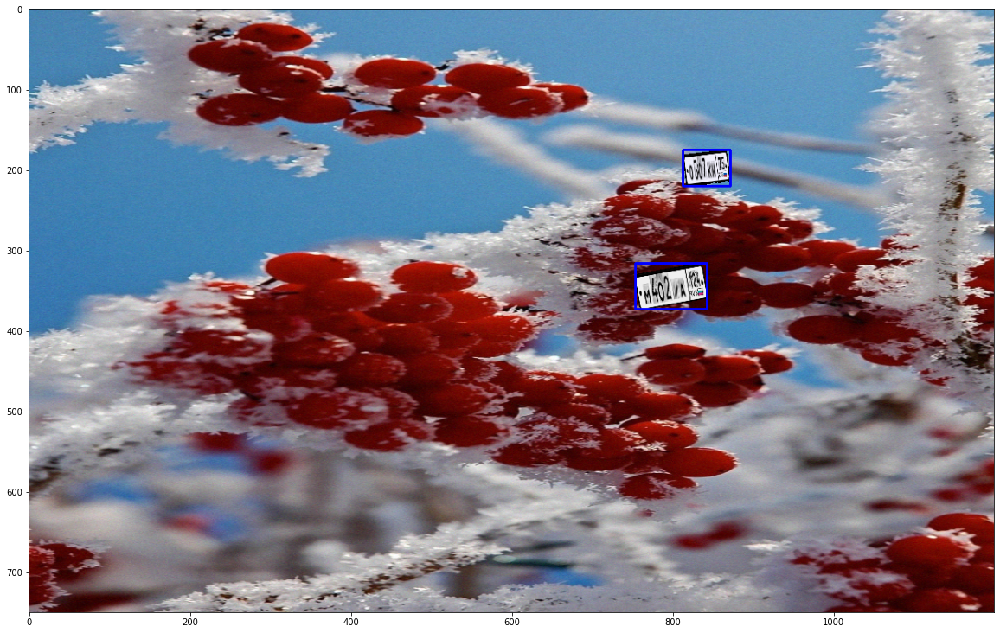

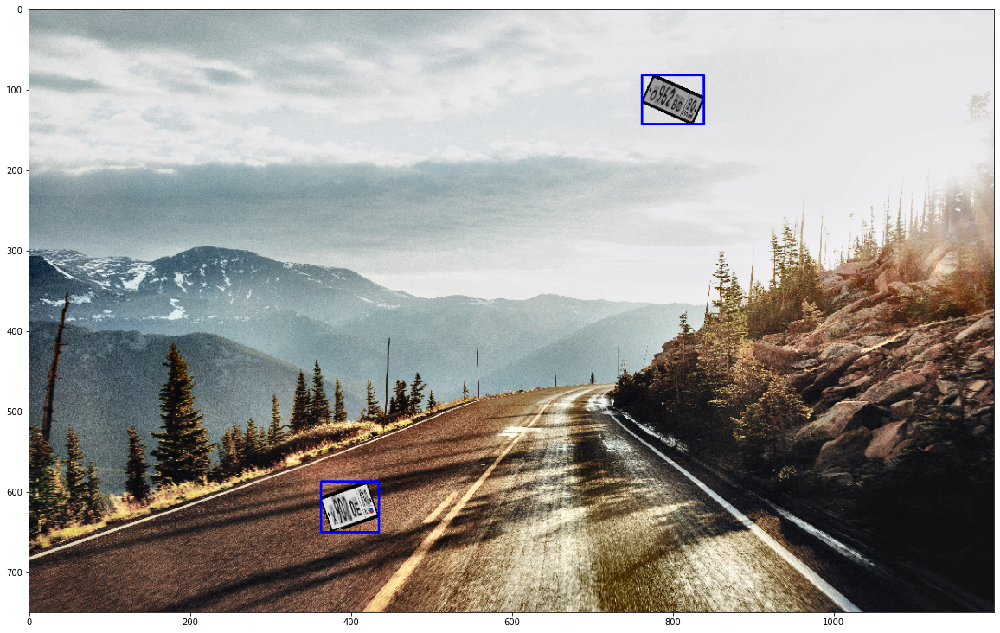

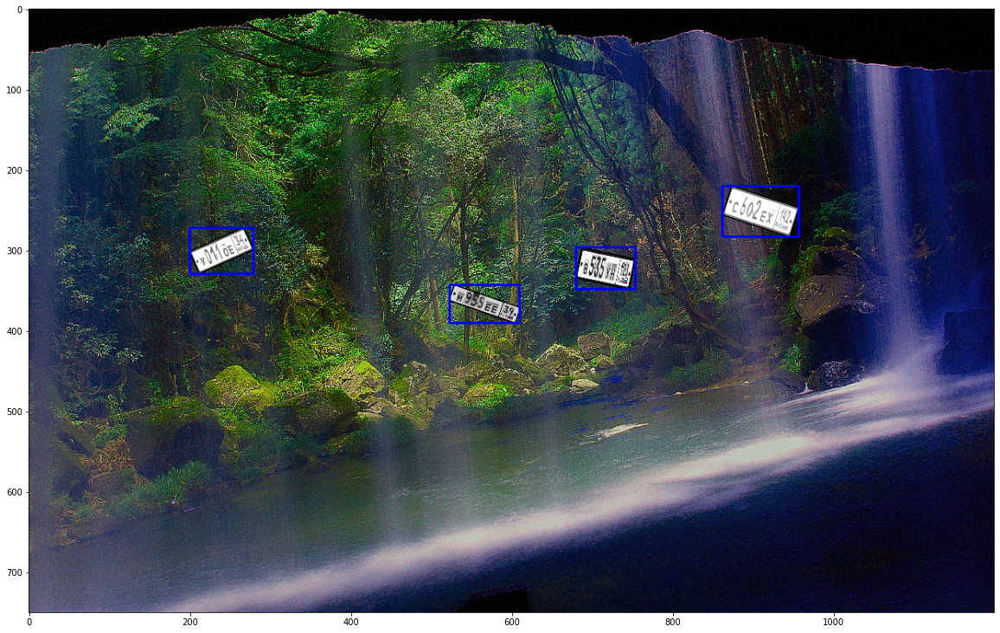

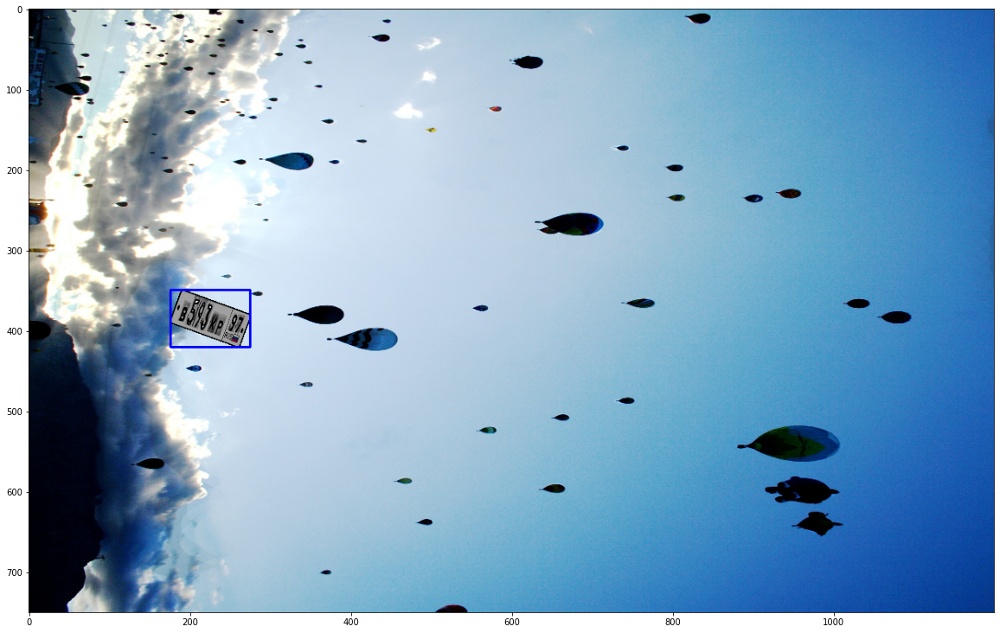

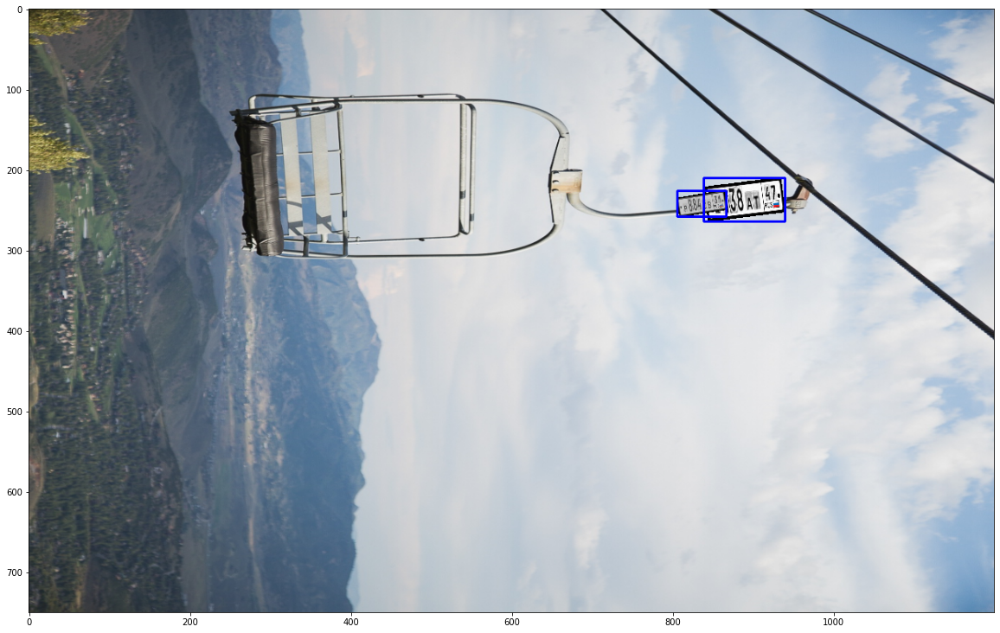

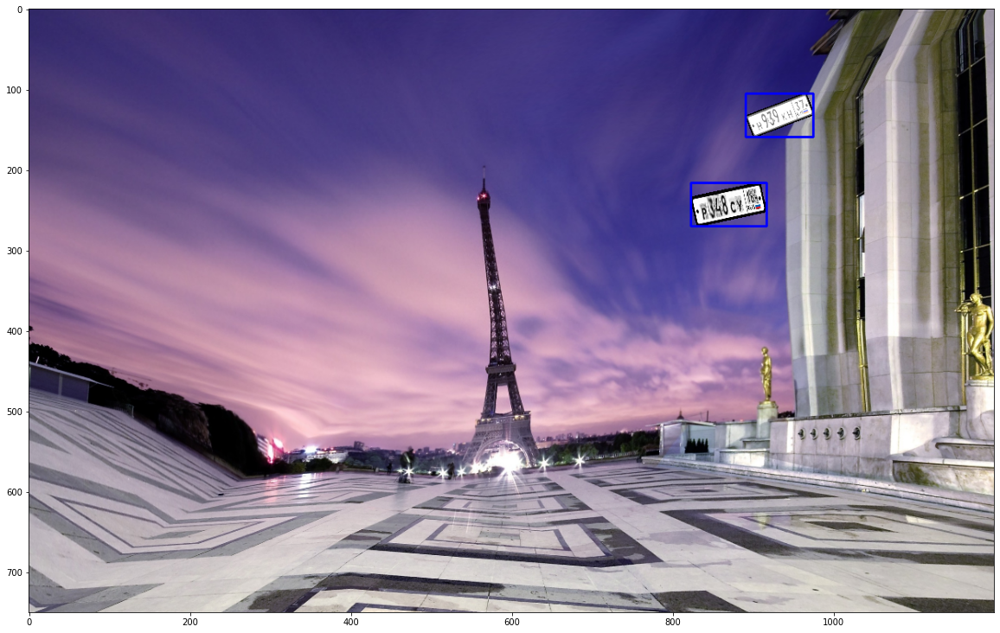

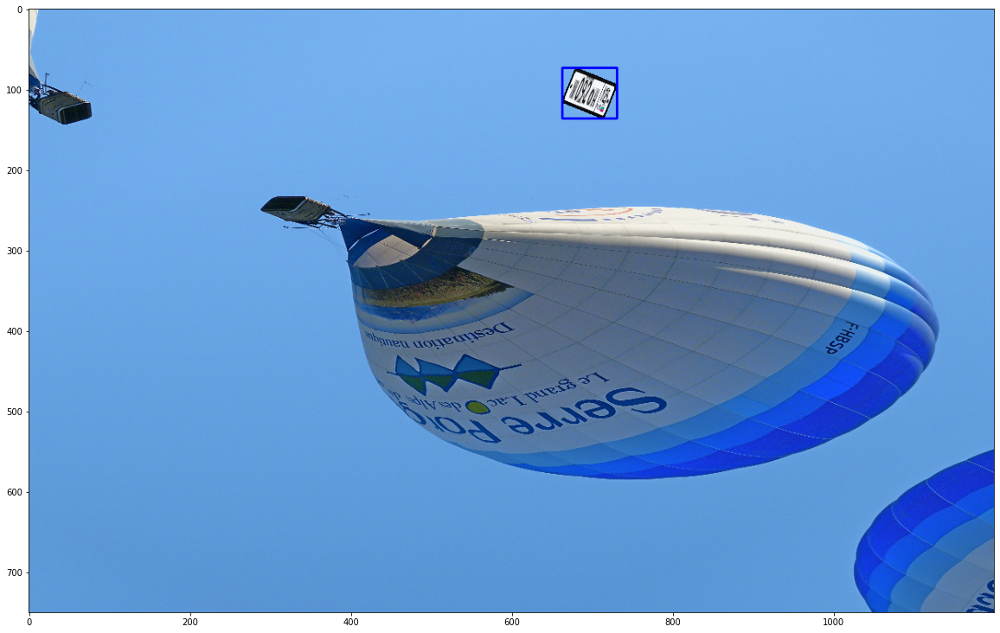

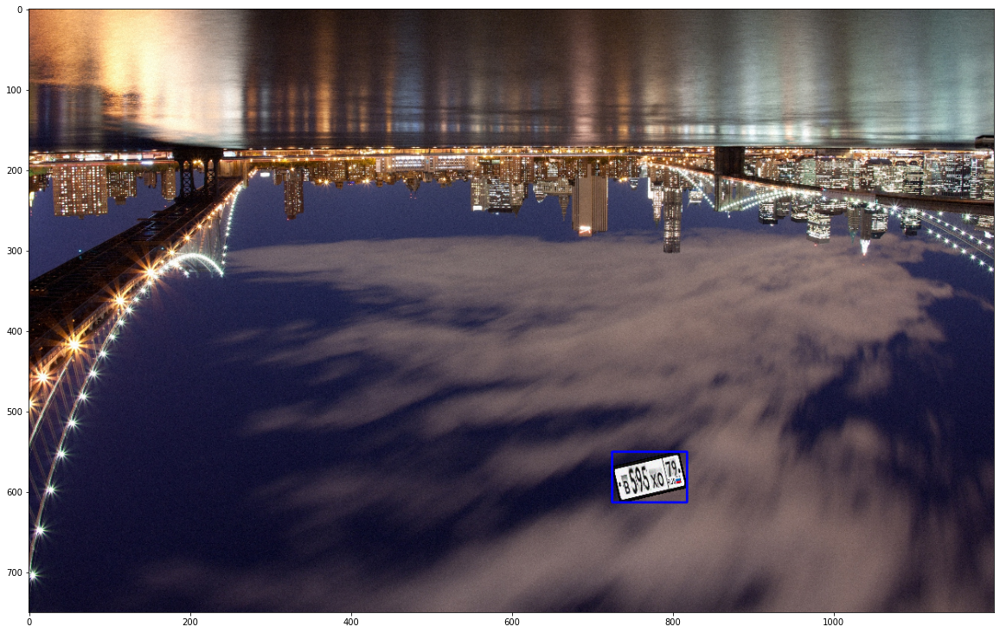

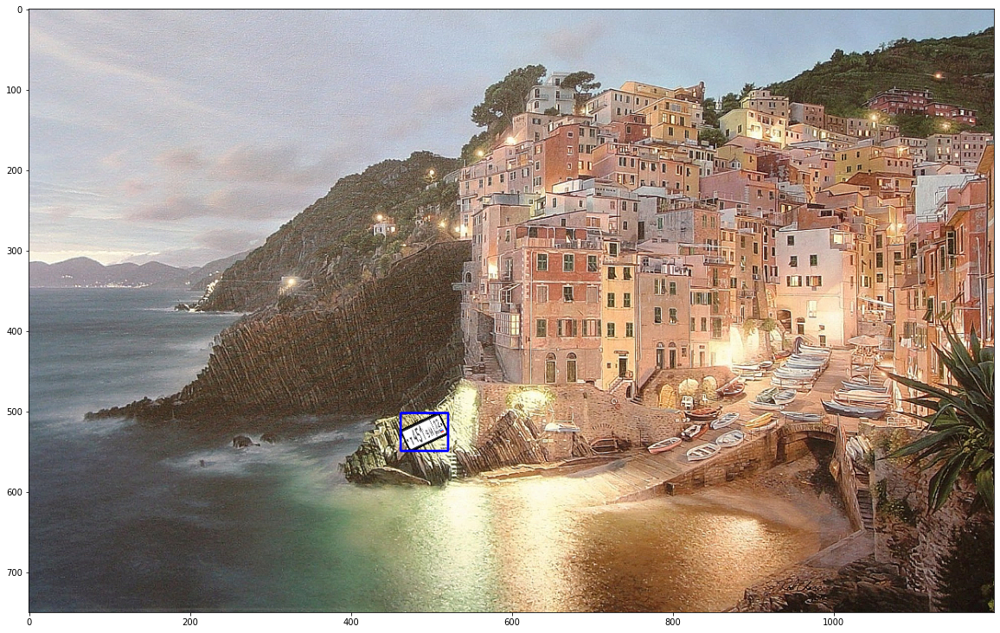

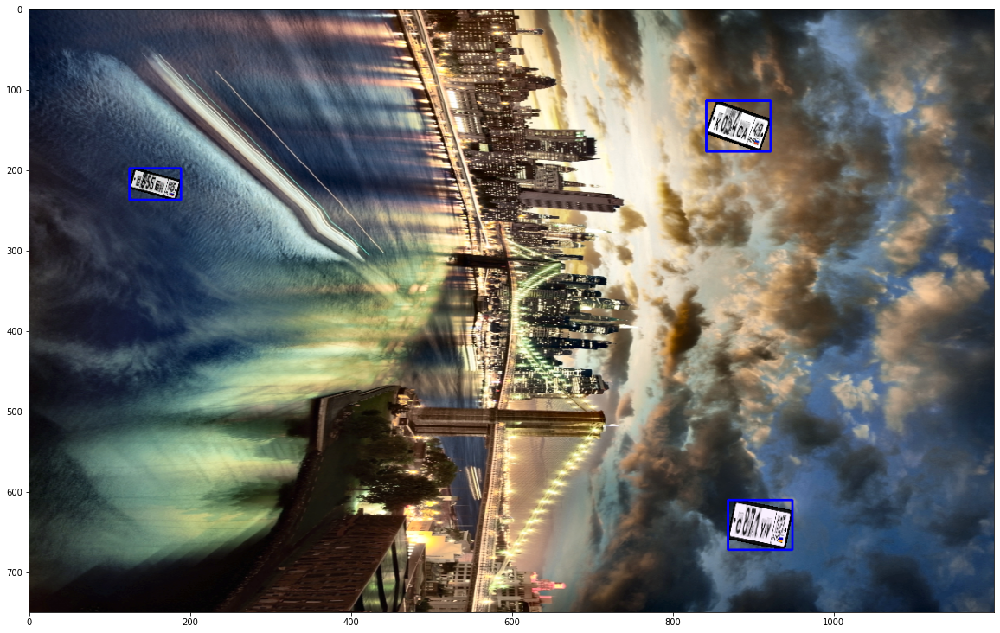

In [100]:
for i in tqdm(range(10)):
    new_pic = make_img_with_plates(files)
    new_pic = new_pic.add_rectangles()
    fig, ax = plt.subplots(figsize=(20, 40))
    ax.imshow(cv2.cvtColor(new_pic.astype('uint8'), cv2.COLOR_BGR2RGB))

Генерируем 10000 изображений и формируем аннотацию:

In [33]:
def make_annotation(pict, n):
    annot = {}
    an = []
    for i, r in enumerate(pict.rectangles):
        an.append({
                    "class": "rect",
                    "width": r[1][0]-r[0][0] ,
                    "height": r[1][1]-r[0][1],
                    "x": (r[1][0]+r[0][0])/2,
                    "y": (r[1][1]+r[0][1])/2,
                    "number": pict.numbers_str[i]})
    annot['annotation'] = an
    annot['class'] = 'image'
    annot['filename'] = "data\\train_synthetic\\"+"image_"+str(n)+".JPG"
    return annot

In [42]:
annotations = []
p_bar = tqdm(range(10000))
for n in p_bar:
    pict = make_img_with_plates(files)
    annot = make_annotation(pict, n)
    cv2.imwrite(annot['filename'], pict.image)
    annotations.append(annot)
    
import json
with open(os.path.join('data', 'train_synthetic', 'syn_autonumber_annotations.json'), "w", encoding="utf-8") as file:
    json.dump(annotations, file)

  0%|          | 0/5000 [00:00<?, ?it/s]

data\general_photo\pexels-abby-chung-1191377.jpg
data\general_photo\look.com.ua-120051.jpg
data\general_photo\323f673192b2f22d614721dcf741199a-l.jpg
data\general_photo\look.com.ua-53950.jpg
data\general_photo\look.com.ua-4352.jpg
data\general_photo\0f9f3f7e2a9bc1291665d79c438e96dc-l.jpg
data\general_photo\look.com.ua-7456.jpg
data\general_photo\00bfd587e9c55d055bb3239e3275a724-l.jpg
data\general_photo\look.com.ua-14788.jpg
data\general_photo\1b60678dc4a5ff1c099d056179dcd784-l.jpg
data\general_photo\look.com.ua-11070.jpg
data\general_photo\look.com.ua-115185.jpg
data\general_photo\look.com.ua-55955.jpg
data\general_photo\pexels-pixabay-262075.jpg
data\general_photo\0f3b598eefff32b6efe3724cd126fd45-l.jpg
data\general_photo\look.com.ua-119113.jpg
data\general_photo\look.com.ua-14144.jpg
data\general_photo\0c41c460067b4e2f133241ff6bc28752-l.jpg
data\general_photo\1a9cb143403bbc6eaa460ebb6a448d24-l.jpg
data\general_photo\look.com.ua-119414.jpg
data\general_photo\look.com.ua-55001.jpg
data\g

data\general_photo\31521a7dc685c6a034650281acd6b9d6-l.jpg
data\general_photo\look.com.ua-68097.jpg
data\general_photo\0b1af3ed9d8800a4917235b598b66dbe-l.jpg
data\general_photo\pexels-flora-westbrook-2262738.jpg
data\general_photo\0fdcce86c48fbc95766606f76cd37154-l.jpg
data\general_photo\1b44f21c2ba33193dbf451ca8e6e917c-l.jpg
data\general_photo\look.com.ua-11414.jpg
data\general_photo\look.com.ua-19412.jpg
data\general_photo\look.com.ua-53440.jpg
data\general_photo\look.com.ua-52536.jpg
data\general_photo\look.com.ua-54302.jpg
data\general_photo\1a6e90f87b086c2421c273bba5493d0f-l.jpg
data\general_photo\pexels-satoshi-hirayama-1532768.jpg
data\general_photo\0a2843fcfb9993e56bd0dbab1f53e82f-l.jpg
data\general_photo\0ccf67f2fd96b55cf9f8b33cdff187f8-l.jpg
data\general_photo\pexels-kaique-rocha-57645.jpg
data\general_photo\look.com.ua-52391.jpg
data\general_photo\pexels-ashutosh-jaiswal-1471203.jpg
data\general_photo\0eddf0feb54954f29b0ee70331fb2640-l.jpg
data\general_photo\1b5ab2e7ba2c7f625

data\general_photo\look.com.ua-19412.jpg
data\general_photo\1a6e90f87b086c2421c273bba5493d0f-l.jpg
data\general_photo\look.com.ua-55384.jpg
data\general_photo\0fb3525dfd1fcdf215509acbd351ca7f-l.jpg
data\general_photo\0dda97b894b82ad2421432c77e3e2e64-l.jpg
data\general_photo\look.com.ua-46403.jpg
data\general_photo\1a17b930c08dc9749be465311601d849-l.jpg
data\general_photo\pexels-min-an-720362.jpg
data\general_photo\look.com.ua-65661.jpg
data\general_photo\look.com.ua-68332.jpg
data\general_photo\look.com.ua-117737.jpg
data\general_photo\look.com.ua-54853.jpg
data\general_photo\look.com.ua-66916.jpg
data\general_photo\look.com.ua-68917.jpg
data\general_photo\look.com.ua-88114.jpg
data\general_photo\look.com.ua-54468.jpg
data\general_photo\look.com.ua-42679.jpg
data\general_photo\1a2bc6c6c75022c65138e1849ae5b549-l.jpg
data\general_photo\pexels-daniel-reche-3601098.jpg
data\general_photo\1a7699e811798fbd0dfe5d5a97c12eab-l.jpg
data\general_photo\pexels-kaique-rocha-57645.jpg
data\general_ph

data\general_photo\look.com.ua-40518.jpg
data\general_photo\0f09214997aad145d226fde9c4881456-l.jpg
data\general_photo\look.com.ua-67000.jpg
data\general_photo\0d8583be846eeac794694c15eccbce0e-l.jpg
data\general_photo\look.com.ua-11415.jpg
data\general_photo\1a39eb454e799789adcce5f256029e80-l.jpg
data\general_photo\0f226ffc9394199a0a6b961141db3923-l.jpg
data\general_photo\look.com.ua-68459.jpg
data\general_photo\1428c6ff56bd208091ef002d5959fe35-l.jpg
data\general_photo\0fa35598ccf165886abf1588fd4df57b-l.jpg
data\general_photo\pexels-adrianna-calvo-17668.jpg
data\general_photo\0d8583be846eeac794694c15eccbce0e-l.jpg
data\general_photo\0f900d3913bd19e1c0cb82df9a6a744c-l.jpg
data\general_photo\0f9f3f7e2a9bc1291665d79c438e96dc-l.jpg
data\general_photo\36616370f4d3ffa3bcb39600278643e2-l.jpg
data\general_photo\1428c6ff56bd208091ef002d5959fe35-l.jpg
data\general_photo\0d8583be846eeac794694c15eccbce0e-l.jpg
data\general_photo\0f9d61a84cec9513c09032564e5e6f4e-l.jpg
data\general_photo\look.com.ua-

data\general_photo\pexels-peter-spencer-813362.jpg
data\general_photo\pexels-alex-amorales-909907.jpg
data\general_photo\look.com.ua-52336.jpg
data\general_photo\look.com.ua-56962.jpg
data\general_photo\look.com.ua-53950.jpg
data\general_photo\look.com.ua-55362.jpg
data\general_photo\0f5f706f538cae91d16bdbb2c76d6a9d-l.jpg
data\general_photo\pexels-lisa-fotios-730256.jpg
data\general_photo\1b8fa92a79e448f6a86dba5322cca68f-l.jpg
data\general_photo\look.com.ua-66330.jpg
data\general_photo\0f3c3518d7ddff0605f5358b2fb0e4e9-l.jpg
data\general_photo\0a3b2ce0167a916c5cab72063b596dd7-l.jpg
data\general_photo\139859a9b31678454991df98d9216ba5-l.jpg
data\general_photo\look.com.ua-34740.jpg
data\general_photo\1b60678dc4a5ff1c099d056179dcd784-l.jpg
data\general_photo\01be6c9cfc31640189046daa6201282e-l.jpg
data\general_photo\1a37818d84aa0a01272107c9cb7260cc-l.jpg
data\general_photo\pexels-negative-space-169572.jpg
data\general_photo\look.com.ua-55407.jpg
data\general_photo\2217bc5624e0761546a80b905eb

data\general_photo\look.com.ua-14643.jpg
data\general_photo\pexels-anete-lusina-5240470.jpg
data\general_photo\look.com.ua-66212.jpg
data\general_photo\look.com.ua-42711.jpg
data\general_photo\look.com.ua-109232.jpg
data\general_photo\look.com.ua-65829.jpg
data\general_photo\pexels-ivars-4324336.jpg
data\general_photo\2b28036838a6e34e88b16c0e4d78af74-l.jpg
data\general_photo\pexels-satoshi-hirayama-1633791.jpg
data\general_photo\0fd19a6218a3c2047d0ba1795c0a7e4c-l.jpg
data\general_photo\08262e609ee4cc6ea28771a3bf1232dc-l.jpg
data\general_photo\0907774cdd04974a79ccadaaa33b72ed-l.jpg
data\general_photo\0e8c91484e17e5da1737625e2baf851e-l.jpg
data\general_photo\look.com.ua-65755.jpg
data\general_photo\1adc5863ec56d380ace85b3bb93b1a36-l.jpg
data\general_photo\0d7986676bbe5a7bfcad8654304240bb-l.jpg
data\general_photo\1b2bc9f2a1a50d87797f9ee640e0e6a6-l.jpg
data\general_photo\look.com.ua-14730.jpg
data\general_photo\0df99b655208f721157bf13bf9c62079-l.jpg
data\general_photo\look.com.ua-55384.jpg

data\general_photo\pexels-josh-hild-4270292.jpg
data\general_photo\look.com.ua-52332.jpg
data\general_photo\pexels-donald-tong-23735.jpg
data\general_photo\0f3b598eefff32b6efe3724cd126fd45-l.jpg
data\general_photo\pexels-burst-374870.jpg
data\general_photo\look.com.ua-22525.jpg
data\general_photo\look.com.ua-53965.jpg
data\general_photo\look.com.ua-111735.jpg
data\general_photo\look.com.ua-67794.jpg
data\general_photo\look.com.ua-57762.jpg
data\general_photo\2b76db742351d7ef45435a3be006f8f2-l.jpg
data\general_photo\0e765fcfb1156d6ac8402d6b8ea7ae50-l.jpg
data\general_photo\1b1784b3040388b3c61095c7a97ef72b-l.jpg
data\general_photo\look.com.ua-119113.jpg
data\general_photo\look.com.ua-9913.jpg
data\general_photo\0dff90382c101ce1099e2cc7fc630c20-l.jpg
data\general_photo\0f900d3913bd19e1c0cb82df9a6a744c-l.jpg
data\general_photo\look.com.ua-68943.jpg
data\general_photo\1116774e44cd44d5fdf4cc2fb9c6ba04-l.jpg
data\general_photo\pexels-michal-knotek-542403.jpg
data\general_photo\01be6c9cfc31640

data\general_photo\1a4e004e1a5a4f8dcd6a0f3ded2d7b40-l.jpg
data\general_photo\1a4e8ce56c0f975107be5ea0441726b0-l.jpg
data\general_photo\look.com.ua-68116.jpg
data\general_photo\look.com.ua-64456.jpg
data\general_photo\look.com.ua-23995.jpg
data\general_photo\look.com.ua-111998.jpg
data\general_photo\look.com.ua-63433.jpg
data\general_photo\0f9e6189e4b7ab863975bd49656a5613-l.jpg
data\general_photo\0e408d858ba1025ed1e18c2eb9876d6f-l.jpg
data\general_photo\look.com.ua-7586.jpg
data\general_photo\look.com.ua-47148.jpg
data\general_photo\0e754a02680f9403926530b797a405bd-l.jpg
data\general_photo\pexels-kaique-rocha-109919.jpg
data\general_photo\1abf6f3b876ca86a12e829ba6fd51ee4-l.jpg
data\general_photo\pexels-aleksandar-pasaric-1530423.jpg
data\general_photo\0b3c9c9ed2cdc7eb7e2b981890b99628-l.jpg
data\general_photo\pexels-maria-orlova-4916436.jpg
data\general_photo\0df99b655208f721157bf13bf9c62079-l.jpg
data\general_photo\pexels-michal-knotek-542403.jpg
data\general_photo\look.com.ua-66089.jpg

data\general_photo\0f8c82dc4f1c7e585ab7a7f5cbea2595-l.jpg
data\general_photo\look.com.ua-14971.jpg
data\general_photo\look.com.ua-111735.jpg
data\general_photo\look.com.ua-14591.jpg
data\general_photo\look.com.ua-52705.jpg
data\general_photo\pexels-anete-lusina-5239966.jpg
data\general_photo\look.com.ua-31861.jpg
data\general_photo\1a82d077489950e75727d2f7cdd18aeb-l.jpg
data\general_photo\pexels-ehsan-ahmadnejad-983436.jpg
data\general_photo\0f9f3f7e2a9bc1291665d79c438e96dc-l.jpg
data\general_photo\pexels-aleksandar-pasaric-3164031.jpg
data\general_photo\look.com.ua-1268.jpg
data\general_photo\look.com.ua-52336.jpg
data\general_photo\0495162549764060419805116979b229-l.jpg
data\general_photo\1428c6ff56bd208091ef002d5959fe35-l.jpg
data\general_photo\look.com.ua-75066.jpg
data\general_photo\look.com.ua-9913.jpg
data\general_photo\pexels-maria-orlova-4916436.jpg
data\general_photo\00bfd587e9c55d055bb3239e3275a724-l.jpg
data\general_photo\2addfdbcf2e5e7c9156979ae2fd7004c-l.jpg
data\general_

data\general_photo\1581819e2edfd436dd72c40828f1550a-l.jpg
data\general_photo\0fd8e8ab77a13880fd01e853f19b2c54-l.jpg
data\general_photo\pexels-daniel-reche-3601098.jpg
data\general_photo\pexels-anete-lusina-5239712.jpg
data\general_photo\look.com.ua-14971.jpg
data\general_photo\pexels-gratisography-536.jpg
data\general_photo\look.com.ua-56962.jpg
data\general_photo\0e5b990ab87a925b69b4b2a5180a36a3-l.jpg
data\general_photo\31521a7dc685c6a034650281acd6b9d6-l.jpg
data\general_photo\pexels-aleksandar-pasaric-3164031.jpg
data\general_photo\pexels-pixabay-221166.jpg
data\general_photo\2c1a5e98e97c94edff5266317b399af1-l.jpg
data\general_photo\look.com.ua-74900.jpg
data\general_photo\pexels-simon-robben-204366.jpg
data\general_photo\1aff8c40f2646666774c39fb8277be9a-l.jpg
data\general_photo\look.com.ua-74892.jpg
data\general_photo\0bcd96c4f1a76c2ac715a0f4e3d55e43-l.jpg
data\general_photo\pexels-pixabay-208701.jpg
data\general_photo\1b2fde4b4943fc64a0d3f4f030b019f6-l.jpg
data\general_photo\2addfd

data\general_photo\pexels-pixabay-159490.jpg
data\general_photo\look.com.ua-54468.jpg
data\general_photo\pexels-elina-sazonova-1850619.jpg
data\general_photo\look.com.ua-118472.jpg
data\general_photo\0e408d858ba1025ed1e18c2eb9876d6f-l.jpg
data\general_photo\look.com.ua-7456.jpg
data\general_photo\1a7699e811798fbd0dfe5d5a97c12eab-l.jpg
data\general_photo\1b01672bb67b4d642b02e03023f77436-l.jpg
data\general_photo\0faf8ce34a0ac5b89b1fe5476086ad76-l.jpg
data\general_photo\0fd8e8ab77a13880fd01e853f19b2c54-l.jpg
data\general_photo\pexels-charles-parker-5847584.jpg
data\general_photo\look.com.ua-118527.jpg
data\general_photo\0f3c3518d7ddff0605f5358b2fb0e4e9-l.jpg
data\general_photo\look.com.ua-54169.jpg
data\general_photo\look.com.ua-114448.jpg
data\general_photo\pexels-andrea-piacquadio-3763878.jpg
data\general_photo\1a82d077489950e75727d2f7cdd18aeb-l.jpg
data\general_photo\look.com.ua-118527.jpg
data\general_photo\22186437a213cb73f5e67c10f7c2afd5-l.jpg
data\general_photo\0907774cdd04974a79cc

data\general_photo\look.com.ua-7456.jpg
data\general_photo\1a0a8b4e3c730f021964f48015ab3745-l.jpg
data\general_photo\0f51db66959158244aa724f8cc077ea6-l.jpg
data\general_photo\0fc69020f5ca02fc6bf6ac396b78bdf0-l.jpg
data\general_photo\look.com.ua-45985.jpg
data\general_photo\1a818be8cbb612f7eda3f490b54f8520-l.jpg
data\general_photo\0e408d858ba1025ed1e18c2eb9876d6f-l.jpg
data\general_photo\0f648babfba1cfd559340c7faefc01b3-l.jpg
data\general_photo\1a7e61c286825d775714d0aa792de63a-l.jpg
data\general_photo\look.com.ua-54195.jpg
data\general_photo\look.com.ua-56872.jpg
data\general_photo\look.com.ua-68917.jpg
data\general_photo\0ce193a64e2f3ee83ca279446e90176d-l.jpg
data\general_photo\3945da89c25f1d8048666438f2243f87-l.jpg
data\general_photo\1b8fa92a79e448f6a86dba5322cca68f-l.jpg
data\general_photo\look.com.ua-48302.jpg
data\general_photo\look.com.ua-61385.jpg
data\general_photo\1b8ac969b6c7728fc6bc50e9fd15d2d0-l.jpg
data\general_photo\0a0b363aecab77b3c0c817e3703bbe59-l.jpg
data\general_photo

data\general_photo\0ef4ba76709d28d7fa1c05d325de4b5f-l.jpg
data\general_photo\look.com.ua-29790.jpg
data\general_photo\pexels-pixabay-248704.jpg
data\general_photo\0f359731c3db7d04930afdfd1edfb3d0-l.jpg
data\general_photo\1b60678dc4a5ff1c099d056179dcd784-l.jpg
data\general_photo\look.com.ua-55653.jpg
data\general_photo\0f968bd4a48158e6fb5d0bfd42629204-l.jpg
data\general_photo\look.com.ua-66330.jpg
data\general_photo\0ccf67f2fd96b55cf9f8b33cdff187f8-l.jpg
data\general_photo\look.com.ua-7886.jpg
data\general_photo\look.com.ua-19410.jpg
data\general_photo\look.com.ua-41504.jpg
data\general_photo\look.com.ua-66916.jpg
data\general_photo\pexels-zen-chung-5538031.jpg
data\general_photo\look.com.ua-52909.jpg
data\general_photo\pexels-mike-350785.jpg
data\general_photo\look.com.ua-54195.jpg
data\general_photo\look.com.ua-41459.jpg
data\general_photo\look.com.ua-129159.jpg
data\general_photo\look.com.ua-66393.jpg
data\general_photo\2bab95a569b5042e38cd9774c3cf4fee-l.jpg
data\general_photo\look.c

data\general_photo\look.com.ua-6896.jpg
data\general_photo\pexels-pixabay-248704.jpg
data\general_photo\36204fb9e494a0f5b695b49449455e01-l.jpg
data\general_photo\pexels-pixabay-159490.jpg
data\general_photo\0ccf67f2fd96b55cf9f8b33cdff187f8-l.jpg
data\general_photo\look.com.ua-14971.jpg
data\general_photo\0eb8ba84425ba3a3d1291f6e891803a3-l.jpg
data\general_photo\pexels-lisa-fotios-730256.jpg
data\general_photo\0faf8ce34a0ac5b89b1fe5476086ad76-l.jpg
data\general_photo\look.com.ua-9862.jpg
data\general_photo\look.com.ua-69087.jpg
data\general_photo\0dda97b894b82ad2421432c77e3e2e64-l.jpg
data\general_photo\look.com.ua-8645.jpg
data\general_photo\look.com.ua-67794.jpg
data\general_photo\0f09214997aad145d226fde9c4881456-l.jpg
data\general_photo\1a17b930c08dc9749be465311601d849-l.jpg
data\general_photo\0a028667c8a54e6afdada7e47b9a8894-l.jpg
data\general_photo\look.com.ua-55653.jpg
data\general_photo\look.com.ua-118810.jpg
data\general_photo\look.com.ua-54007.jpg
data\general_photo\pexels-rica

data\general_photo\0f4a41e1c74ec17f7ee7ea1e4a63b4d0-l.jpg
data\general_photo\look.com.ua-64456.jpg
data\general_photo\pexels-zen-chung-5538031.jpg
data\general_photo\look.com.ua-56962.jpg
data\general_photo\1a056cb91d4b37ad9c4fba77341b09fb-l.jpg
data\general_photo\1b8ccba07b36aae86d81674358d4c53f-l.jpg
data\general_photo\1b14cb7c2b9332b4f65553a101ad106b-l.jpg
data\general_photo\170995ccb565bd68e081d89c6f516432-l.jpg
data\general_photo\look.com.ua-114448.jpg
data\general_photo\look.com.ua-59750.jpg
data\general_photo\pexels-josh-hild-4190056.jpg
data\general_photo\look.com.ua-65763.jpg
data\general_photo\pexels-aleksandar-pasaric-1530423.jpg
data\general_photo\0f218ef3c6b496e7319e6617490fc68d-l.jpg
data\general_photo\1b5ab2e7ba2c7f6256d7d81ae472b90b-l.jpg
data\general_photo\0f226ffc9394199a0a6b961141db3923-l.jpg
data\general_photo\1116774e44cd44d5fdf4cc2fb9c6ba04-l.jpg
data\general_photo\pexels-amina-filkins-5425059.jpg
data\general_photo\pexels-skitterphoto-422844.jpg
data\general_phot

data\general_photo\pexels-maria-orlova-4916270.jpg
data\general_photo\0e8c91484e17e5da1737625e2baf851e-l.jpg
data\general_photo\pexels-pixabay-159868.jpg
data\general_photo\2bab95a569b5042e38cd9774c3cf4fee-l.jpg
data\general_photo\0a028667c8a54e6afdada7e47b9a8894-l.jpg
data\general_photo\look.com.ua-66985.jpg
data\general_photo\0a3b2ce0167a916c5cab72063b596dd7-l.jpg
data\general_photo\1b8ac969b6c7728fc6bc50e9fd15d2d0-l.jpg
data\general_photo\look.com.ua-65314.jpg
data\general_photo\look.com.ua-54302.jpg
data\general_photo\look.com.ua-52660.jpg
data\general_photo\look.com.ua-31861.jpg
data\general_photo\look.com.ua-65314.jpg
data\general_photo\0f359731c3db7d04930afdfd1edfb3d0-l.jpg
data\general_photo\look.com.ua-65829.jpg
data\general_photo\pexels-mentatdgt-1266152.jpg
data\general_photo\look.com.ua-29807.jpg
data\general_photo\look.com.ua-16837.jpg
data\general_photo\look.com.ua-14144.jpg
data\general_photo\0ab9b1f762b8f1f9656959b0fc8b9338-l.jpg
data\general_photo\0f3c3518d7ddff0605f53

data\general_photo\1b01672bb67b4d642b02e03023f77436-l.jpg
data\general_photo\1b14cb7c2b9332b4f65553a101ad106b-l.jpg
data\general_photo\look.com.ua-55362.jpg
data\general_photo\look.com.ua-7073.jpg
data\general_photo\pexels-mike-350785.jpg
data\general_photo\1792cf8247f576073b914c7bbc20474e-l.jpg
data\general_photo\look.com.ua-14788.jpg
data\general_photo\pexels-p-c-1805818.jpg
data\general_photo\look.com.ua-65604.jpg
data\general_photo\pexels-min-an-720362.jpg
data\general_photo\36616370f4d3ffa3bcb39600278643e2-l.jpg
data\general_photo\01be6c9cfc31640189046daa6201282e-l.jpg
data\general_photo\0ef8ef183a53741ebd9e8a72d7a493ff-l.jpg
data\general_photo\pexels-karol-d-409701.jpg
data\general_photo\300070288f41955c9f554d5399420e72-l.jpg
data\general_photo\look.com.ua-40518.jpg
data\general_photo\look.com.ua-68114.jpg
data\general_photo\027480fa12d1589c3fc1199483e520fc-l.jpg
data\general_photo\look.com.ua-75066.jpg
data\general_photo\look.com.ua-68118.jpg
data\general_photo\look.com.ua-11173

data\general_photo\look.com.ua-55955.jpg
data\general_photo\0c2b0902458f0d1c5bdb6a835276fa2e-l.jpg
data\general_photo\look.com.ua-40518.jpg
data\general_photo\look.com.ua-114531.jpg
data\general_photo\1af95f792e6e5455dfbeead8f0ebee1d-l.jpg
data\general_photo\look.com.ua-42708.jpg
data\general_photo\0f9e6189e4b7ab863975bd49656a5613-l.jpg
data\general_photo\22186437a213cb73f5e67c10f7c2afd5-l.jpg
data\general_photo\1b8fa92a79e448f6a86dba5322cca68f-l.jpg
data\general_photo\0f9f3f7e2a9bc1291665d79c438e96dc-l.jpg
data\general_photo\look.com.ua-68116.jpg
data\general_photo\look.com.ua-9023.jpg
data\general_photo\0e408d858ba1025ed1e18c2eb9876d6f-l.jpg
data\general_photo\pexels-simon-robben-204366.jpg
data\general_photo\0f900d3913bd19e1c0cb82df9a6a744c-l.jpg
data\general_photo\pexels-2951457.jpg
data\general_photo\0fdad67fb998e8eab994c99a4099ede0-l.jpg
data\general_photo\pexels-pixabay-221166.jpg
data\general_photo\look.com.ua-74893.jpg
data\general_photo\look.com.ua-69244.jpg
data\general_phot

data\general_photo\look.com.ua-45647.jpg
data\general_photo\0df507bfdc7eaaba029868731620ae43-l.jpg
data\general_photo\pexels-maria-orlova-4916270.jpg
data\general_photo\0dda97b894b82ad2421432c77e3e2e64-l.jpg
data\general_photo\0ccf67f2fd96b55cf9f8b33cdff187f8-l.jpg
data\general_photo\look.com.ua-32179.jpg
data\general_photo\19437cf2b7aab6348865a88cb065c66b-l.jpg
data\general_photo\look.com.ua-31408.jpg
data\general_photo\look.com.ua-41504.jpg
data\general_photo\1b2e3914dd1022a19b864baa7dc6f95e-l.jpg
data\general_photo\0ed22661b11076f511af93bfc6c24bb1-l.jpg
data\general_photo\pexels-kaique-rocha-109919.jpg
data\general_photo\look.com.ua-7034.jpg
data\general_photo\look.com.ua-7073.jpg
data\general_photo\look.com.ua-53390.jpg
data\general_photo\look.com.ua-67794.jpg
data\general_photo\1b75524bf74f7cca9b330ccf2a5d160e-l.jpg
data\general_photo\0fc69020f5ca02fc6bf6ac396b78bdf0-l.jpg
data\general_photo\look.com.ua-53950.jpg
data\general_photo\pexels-simon-robben-204366.jpg
data\general_photo

data\general_photo\1aff8c40f2646666774c39fb8277be9a-l.jpg
data\general_photo\0f51db66959158244aa724f8cc077ea6-l.jpg
data\general_photo\01b3e1e13bfaee5ff522432bbb01224a-l.jpg
data\general_photo\look.com.ua-46403.jpg
data\general_photo\1b3da9227d37a8aa567c80c9c83f04f7-l.jpg
data\general_photo\look.com.ua-74900.jpg
data\general_photo\22186437a213cb73f5e67c10f7c2afd5-l.jpg
data\general_photo\look.com.ua-6897.jpg
data\general_photo\0f648babfba1cfd559340c7faefc01b3-l.jpg
data\general_photo\0a2843fcfb9993e56bd0dbab1f53e82f-l.jpg
data\general_photo\0a3b2ce0167a916c5cab72063b596dd7-l.jpg
data\general_photo\pexels-skitterphoto-422844.jpg
data\general_photo\01e550aae17c6de3c4c0c4de41c69805-l.jpg
data\general_photo\pexels-anete-lusina-5240470.jpg
data\general_photo\0fd19a6218a3c2047d0ba1795c0a7e4c-l.jpg
data\general_photo\0a61b8645ff168a06c88268f4fbcf332-l.jpg
data\general_photo\look.com.ua-14613.jpg
data\general_photo\2c1a5e98e97c94edff5266317b399af1-l.jpg
data\general_photo\look.com.ua-69042.jpg

data\general_photo\pexels-anete-lusina-5239966.jpg
data\general_photo\0f648babfba1cfd559340c7faefc01b3-l.jpg
data\general_photo\0f9d61a84cec9513c09032564e5e6f4e-l.jpg
data\general_photo\look.com.ua-8645.jpg
data\general_photo\1b2bc9f2a1a50d87797f9ee640e0e6a6-l.jpg
data\general_photo\1b2bc9f2a1a50d87797f9ee640e0e6a6-l.jpg
data\general_photo\look.com.ua-65755.jpg
data\general_photo\pexels-gratisography-536.jpg
data\general_photo\1b6cebf60d185bfc61e94f5ffcc0f2d3-l.jpg
data\general_photo\look.com.ua-74894.jpg
data\general_photo\0fd19a6218a3c2047d0ba1795c0a7e4c-l.jpg
data\general_photo\1a0a8b4e3c730f021964f48015ab3745-l.jpg
data\general_photo\look.com.ua-11414.jpg
data\general_photo\pexels-maria-orlova-4916436.jpg
data\general_photo\1a7e61c286825d775714d0aa792de63a-l.jpg
data\general_photo\look.com.ua-111935.jpg
data\general_photo\1a17b930c08dc9749be465311601d849-l.jpg
data\general_photo\look.com.ua-57490.jpg
data\general_photo\look.com.ua-64311.jpg
data\general_photo\1a818be8cbb612f7eda3f4

data\general_photo\look.com.ua-68114.jpg
data\general_photo\0df56e78fc9dcb0e89698f1f5d1b938a-l.jpg
data\general_photo\pexels-margerretta-548084.jpg
data\general_photo\0bc3587716ebf0da928db1efc2170bb6-l.jpg
data\general_photo\1b2bc9f2a1a50d87797f9ee640e0e6a6-l.jpg
data\general_photo\1b2e3914dd1022a19b864baa7dc6f95e-l.jpg
data\general_photo\pexels-lumn-297743.jpg
data\general_photo\046350d85a97e9357784ea1005af4997-l.jpg
data\general_photo\look.com.ua-69244.jpg
data\general_photo\look.com.ua-55886.jpg
data\general_photo\0ce193a64e2f3ee83ca279446e90176d-l.jpg
data\general_photo\0403a3ead5dae83b11ac46c5d89263e4-l.jpg
data\general_photo\pexels-tatiana-614484.jpg
data\general_photo\look.com.ua-74893.jpg
data\general_photo\look.com.ua-118527.jpg
data\general_photo\0f48da086153038a40d04404cfdb6928-l.jpg
data\general_photo\0dff90382c101ce1099e2cc7fc630c20-l.jpg
data\general_photo\look.com.ua-114448.jpg
data\general_photo\0ccf67f2fd96b55cf9f8b33cdff187f8-l.jpg
data\general_photo\0fd8e8ab77a13880f

data\general_photo\look.com.ua-68097.jpg
data\general_photo\look.com.ua-55362.jpg
data\general_photo\0f5ba5565c8c82ca66089b5c890eb71a-l.jpg
data\general_photo\1a8c73f77d24a71b23cf767314166b9c-l.jpg
data\general_photo\1b0aa2e9e554a5ade406f52909713046-l.jpg
data\general_photo\pexels-samson-katt-5255612.jpg
data\general_photo\1af95f792e6e5455dfbeead8f0ebee1d-l.jpg
data\general_photo\pexels-william-sun-1098662.jpg
data\general_photo\pexels-budgeron-bach-5158254.jpg
data\general_photo\0bc3587716ebf0da928db1efc2170bb6-l.jpg
data\general_photo\pexels-pixabay-208701.jpg
data\general_photo\look.com.ua-54393.jpg
data\general_photo\001fecc376254b18109ae4cfa87615e3-l.jpg
data\general_photo\look.com.ua-31408.jpg
data\general_photo\pexels-charles-parker-5847584.jpg
data\general_photo\0e408d858ba1025ed1e18c2eb9876d6f-l.jpg
data\general_photo\1a2bc6c6c75022c65138e1849ae5b549-l.jpg
data\general_photo\1b44f21c2ba33193dbf451ca8e6e917c-l.jpg
data\general_photo\look.com.ua-54960.jpg
data\general_photo\1b0a

data\general_photo\0b1af3ed9d8800a4917235b598b66dbe-l.jpg
data\general_photo\look.com.ua-19410.jpg
data\general_photo\0ef4ba76709d28d7fa1c05d325de4b5f-l.jpg
data\general_photo\pexels-samson-katt-5255612.jpg
data\general_photo\look.com.ua-13500.jpg
data\general_photo\pexels-burak-k-701337.jpg
data\general_photo\1b14cb7c2b9332b4f65553a101ad106b-l.jpg
data\general_photo\pexels-nappy-936048.jpg
data\general_photo\1a0a8b4e3c730f021964f48015ab3745-l.jpg
data\general_photo\0e408d858ba1025ed1e18c2eb9876d6f-l.jpg
data\general_photo\0fd19a6218a3c2047d0ba1795c0a7e4c-l.jpg
data\general_photo\1adc5863ec56d380ace85b3bb93b1a36-l.jpg
data\general_photo\1b2816eb6541fcef6698e6d123187474-l.jpg
data\general_photo\22646b239a3f4827d1152dbd21a20e2f-l.jpg
data\general_photo\look.com.ua-74693.jpg
data\general_photo\pexels-andrea-piacquadio-3763878.jpg
data\general_photo\look.com.ua-7586.jpg
data\general_photo\pexels-andrea-piacquadio-838413.jpg
data\general_photo\look.com.ua-53390.jpg
data\general_photo\0e8c91

data\general_photo\pexels-adrianna-calvo-17668.jpg
data\general_photo\look.com.ua-54007.jpg
data\general_photo\22646b239a3f4827d1152dbd21a20e2f-l.jpg
data\general_photo\look.com.ua-19913.jpg
data\general_photo\look.com.ua-66565.jpg
data\general_photo\look.com.ua-118527.jpg
data\general_photo\0eb8ba84425ba3a3d1291f6e891803a3-l.jpg
data\general_photo\look.com.ua-54302.jpg
data\general_photo\look.com.ua-52705.jpg
data\general_photo\look.com.ua-11415.jpg
data\general_photo\look.com.ua-54393.jpg
data\general_photo\0ea0cefa6200b7b3abfc54d0f14bd80b-l.jpg
data\general_photo\look.com.ua-7456.jpg
data\general_photo\001b3bb466d65ea36ede2f77a897622a-l.jpg
data\general_photo\look.com.ua-6897.jpg
data\general_photo\look.com.ua-52536.jpg
data\general_photo\look.com.ua-52421.jpg
data\general_photo\01e550aae17c6de3c4c0c4de41c69805-l.jpg
data\general_photo\look.com.ua-75066.jpg
data\general_photo\look.com.ua-11415.jpg
data\general_photo\look.com.ua-11414.jpg
data\general_photo\look.com.ua-111998.jpg
dat

data\general_photo\1428c6ff56bd208091ef002d5959fe35-l.jpg
data\general_photo\0f900d3913bd19e1c0cb82df9a6a744c-l.jpg
data\general_photo\pexels-maria-orlova-4916436.jpg
data\general_photo\look.com.ua-52417.jpg
data\general_photo\0bc3587716ebf0da928db1efc2170bb6-l.jpg
data\general_photo\look.com.ua-52391.jpg
data\general_photo\0ed22661b11076f511af93bfc6c24bb1-l.jpg
data\general_photo\look.com.ua-7073.jpg
data\general_photo\pexels-pixabay-159490.jpg
data\general_photo\look.com.ua-54960.jpg
data\general_photo\01be6c9cfc31640189046daa6201282e-l.jpg
data\general_photo\0a0b363aecab77b3c0c817e3703bbe59-l.jpg
data\general_photo\pexels-jacob-morch-457418.jpg
data\general_photo\0f4a41e1c74ec17f7ee7ea1e4a63b4d0-l.jpg
data\general_photo\pexels-peter-spencer-813362.jpg
data\general_photo\pexels-peter-spencer-813362.jpg
data\general_photo\look.com.ua-118810.jpg
data\general_photo\look.com.ua-11416.jpg
data\general_photo\pexels-andrea-piacquadio-3763878.jpg
data\general_photo\0e5b990ab87a925b69b4b2a518

data\general_photo\0eb8ba84425ba3a3d1291f6e891803a3-l.jpg
data\general_photo\look.com.ua-14971.jpg
data\general_photo\look.com.ua-54302.jpg
data\general_photo\2b49baa3ea4f48666868c0c98184773e-l.jpg
data\general_photo\look.com.ua-114448.jpg
data\general_photo\1a55559139de754d51bc729cd53c85ad-l.jpg
data\general_photo\pexels-samson-katt-5255612.jpg
data\general_photo\look.com.ua-32184.jpg
data\general_photo\look.com.ua-74900.jpg
data\general_photo\1b14cb7c2b9332b4f65553a101ad106b-l.jpg
data\general_photo\look.com.ua-114255.jpg
data\general_photo\2b5810497d7b001c36ba3947ec954f9d-l.jpg
data\general_photo\pexels-elina-sazonova-1850619.jpg
data\general_photo\look.com.ua-65763.jpg
data\general_photo\pexels-skitterphoto-422844.jpg
data\general_photo\0a0b363aecab77b3c0c817e3703bbe59-l.jpg
data\general_photo\pexels-donald-tong-23735.jpg
data\general_photo\look.com.ua-120051.jpg
data\general_photo\0ab9b1f762b8f1f9656959b0fc8b9338-l.jpg
data\general_photo\pexels-anete-lusina-5239712.jpg
data\genera

data\general_photo\0ea0cefa6200b7b3abfc54d0f14bd80b-l.jpg
data\general_photo\look.com.ua-8645.jpg
data\general_photo\0e754a02680f9403926530b797a405bd-l.jpg
data\general_photo\look.com.ua-56766.jpg
data\general_photo\look.com.ua-19913.jpg
data\general_photo\look.com.ua-68098.jpg
data\general_photo\01e550aae17c6de3c4c0c4de41c69805-l.jpg
data\general_photo\look.com.ua-54302.jpg
data\general_photo\look.com.ua-12487.jpg
data\general_photo\look.com.ua-53965.jpg
data\general_photo\look.com.ua-56754.jpg
data\general_photo\0495162549764060419805116979b229-l.jpg
data\general_photo\look.com.ua-67000.jpg
data\general_photo\look.com.ua-66330.jpg
data\general_photo\look.com.ua-118471.jpg
data\general_photo\01b3e1e13bfaee5ff522432bbb01224a-l.jpg
data\general_photo\look.com.ua-54853.jpg
data\general_photo\0df56e78fc9dcb0e89698f1f5d1b938a-l.jpg
data\general_photo\look.com.ua-54302.jpg
data\general_photo\look.com.ua-56962.jpg
data\general_photo\0f648babfba1cfd559340c7faefc01b3-l.jpg
data\general_photo\l

data\general_photo\1a8c73f77d24a71b23cf767314166b9c-l.jpg
data\general_photo\look.com.ua-9913.jpg
data\general_photo\look.com.ua-66692.jpg
data\general_photo\2b76db742351d7ef45435a3be006f8f2-l.jpg
data\general_photo\look.com.ua-74774.jpg
data\general_photo\pexels-satoshi-hirayama-1633791.jpg
data\general_photo\look.com.ua-66330.jpg
data\general_photo\look.com.ua-45647.jpg
data\general_photo\look.com.ua-19412.jpg
data\general_photo\pexels-anderson-guerra-1154198.jpg
data\general_photo\00bfd587e9c55d055bb3239e3275a724-l.jpg
data\general_photo\pexels-jacob-morch-457418.jpg
data\general_photo\0d48e46b252caea5c77746ee61415234-l.jpg
data\general_photo\pexels-ivars-4324336.jpg
data\general_photo\look.com.ua-114554.jpg
data\general_photo\pexels-budgeron-bach-5158254.jpg
data\general_photo\2b5810497d7b001c36ba3947ec954f9d-l.jpg
data\general_photo\01fd363709c373bf02b6fac1a7bfb587-l.jpg
data\general_photo\look.com.ua-66330.jpg
data\general_photo\look.com.ua-118470.jpg
data\general_photo\look.com.

data\general_photo\look.com.ua-14591.jpg
data\general_photo\0a0b363aecab77b3c0c817e3703bbe59-l.jpg
data\general_photo\1a2bc6c6c75022c65138e1849ae5b549-l.jpg
data\general_photo\look.com.ua-68097.jpg
data\general_photo\look.com.ua-9648.jpg
data\general_photo\look.com.ua-14862.jpg
data\general_photo\pexels-anete-lusina-5239966.jpg
data\general_photo\pexels-charles-parker-5847571.jpg
data\general_photo\look.com.ua-54302.jpg
data\general_photo\pexels-burak-k-701337.jpg
data\general_photo\1a818be8cbb612f7eda3f490b54f8520-l.jpg
data\general_photo\0e0150e561c2221350fccc75c256eaeb-l.jpg
data\general_photo\0fdcce86c48fbc95766606f76cd37154-l.jpg
data\general_photo\1b8ac969b6c7728fc6bc50e9fd15d2d0-l.jpg
data\general_photo\0df507bfdc7eaaba029868731620ae43-l.jpg
data\general_photo\look.com.ua-55148.jpg
data\general_photo\pexels-pixabay-210017.jpg
data\general_photo\look.com.ua-14931.jpg
data\general_photo\1a37818d84aa0a01272107c9cb7260cc-l.jpg
data\general_photo\look.com.ua-16620.jpg
data\general_ph

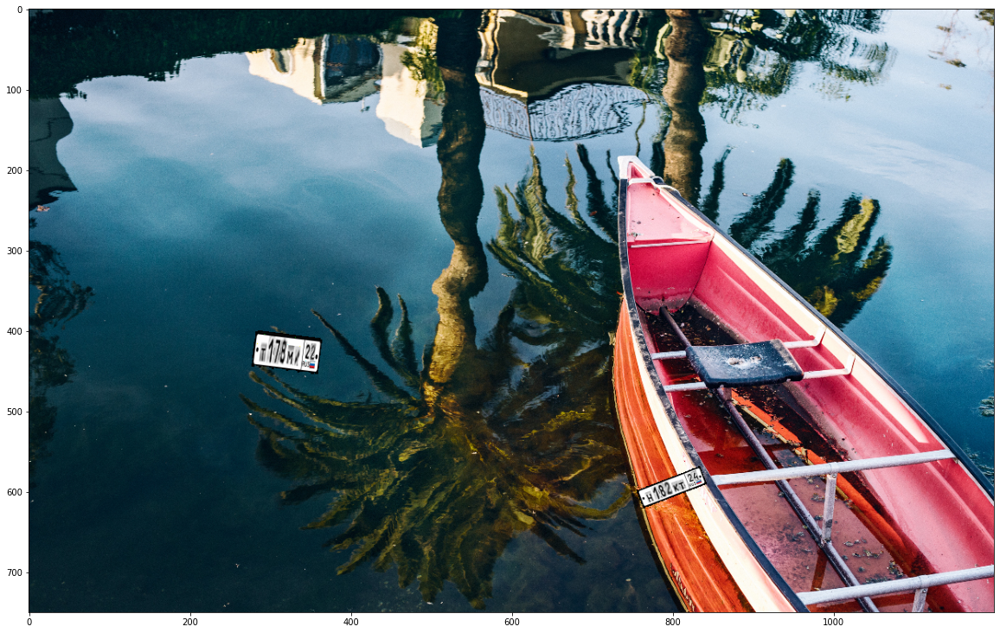

In [43]:
pict.viewImage()